In [1]:
import torch
from diffusers import StableDiffusionXLImg2ImgPipeline

from genaibook.core import get_device

device = get_device()

# Load the pipeline
img2img_pipeline = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
)

model_index.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/4.52G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [6]:
url

'https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-sdxl-init.png'

In [4]:
img2img_pipeline = img2img_pipeline.to(device)

  0%|          | 0/35 [00:00<?, ?it/s]

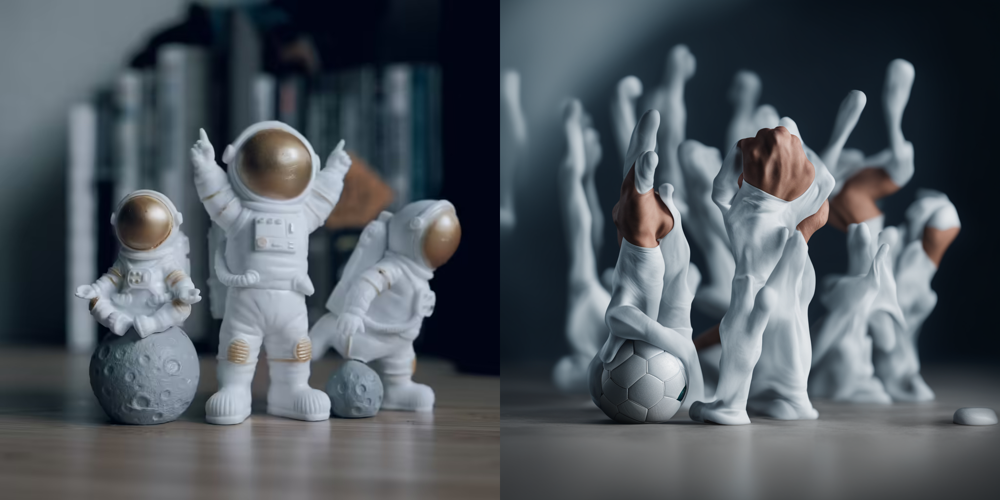

In [7]:
from genaibook.core import image_grid, load_image, SampleURL

# Load the image
url = SampleURL.ToyAstronauts
init_image = load_image(url)
generator = torch.Generator(device=device).manual_seed(1)

prompt = "soccer, play , 8k"

# Pass the prompt and the image through the pipeline
image = img2img_pipeline(prompt, image=init_image, generator=generator, strength=0.7).images[0]
image_grid([init_image, image], rows=1, cols=2)

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

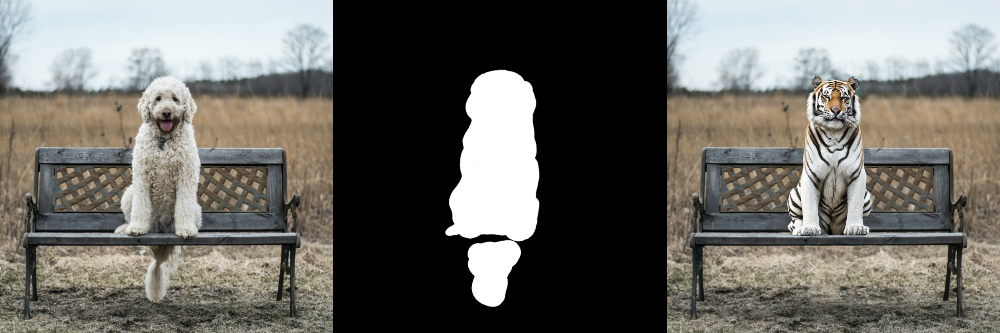

In [8]:
from diffusers import StableDiffusionXLInpaintPipeline

# Load the pipeline
inpaint_pipeline = StableDiffusionXLInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to(device)

img_url = SampleURL.DogBenchImage
mask_url = SampleURL.DogBenchMask

init_image = load_image(img_url, size=(1024, 1024))
mask_image = load_image(mask_url, size=(1024, 1024))

# Pass images and prompt through the pipeline
prompt = "A majestic tiger sitting on a bench"
image = inpaint_pipeline(
    prompt=prompt,
    image=init_image,
    mask_image=mask_image,
    num_inference_steps=50,
    strength=0.80,
    width=init_image.size[0],
    heigth=init_image.size[1],
).images[0]

image_grid([init_image, mask_image, image], rows=1, cols=3)

In [9]:
from diffusers import DiffusionPipeline

pipeline = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [10]:
from compel import Compel, ReturnedEmbeddingsType

# Use the penultimate CLIP layer as it is more expressive
embeddings_type = (
    ReturnedEmbeddingsType.PENULTIMATE_HIDDEN_STATES_NON_NORMALIZED
)
compel = Compel(
    tokenizer=[pipeline.tokenizer, pipeline.tokenizer_2],
    text_encoder=[pipeline.text_encoder, pipeline.text_encoder_2],
    returned_embeddings_type=embeddings_type,
    requires_pooled=[False, True],
)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

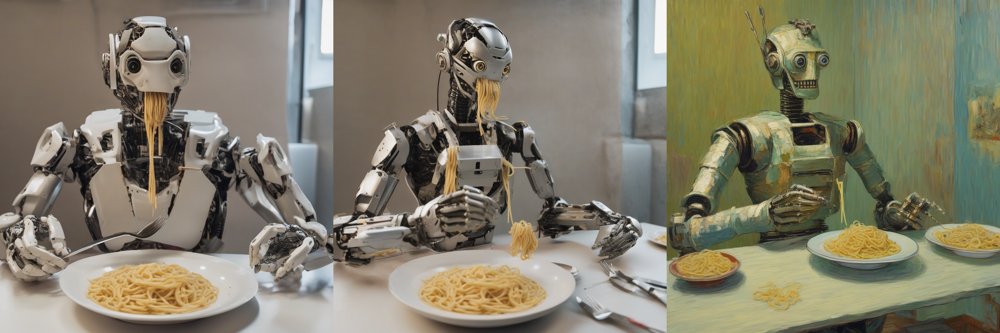

In [11]:
from diffusers.utils import make_image_grid

# Prepare the prompts
prompts = []
prompts.append("a humanoid robot eating pasta")
prompts.append(
    "a humanoid+++ robot eating pasta"
)  # make its humanoid characteristics a bit more pronounced
prompts.append(
    '["a humanoid robot eating pasta", "a van gogh painting"].and(0.8, 0.2)'
)  # make it van gogh!

images = []
for prompt in prompts:
    # Use the same seed across generations
    generator = torch.Generator(device=device).manual_seed(1)

    # The compel library returns both the conditioning vectors 
    # and the pooled prompt embeds
    conditioning, pooled = compel(prompt)

    # We pass the conditioning and pooled prompt embeds to the pipeline
    image = pipeline(
        prompt_embeds=conditioning,
        pooled_prompt_embeds=pooled,
        num_inference_steps=30,
        generator=generator,
    ).images[0]
    images.append(image)
image_grid(images, rows=1, cols=3)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

This pipeline only supports DDIMScheduler and DPMSolverMultistepScheduler. The scheduler has been changed to DPMSolverMultistepScheduler.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

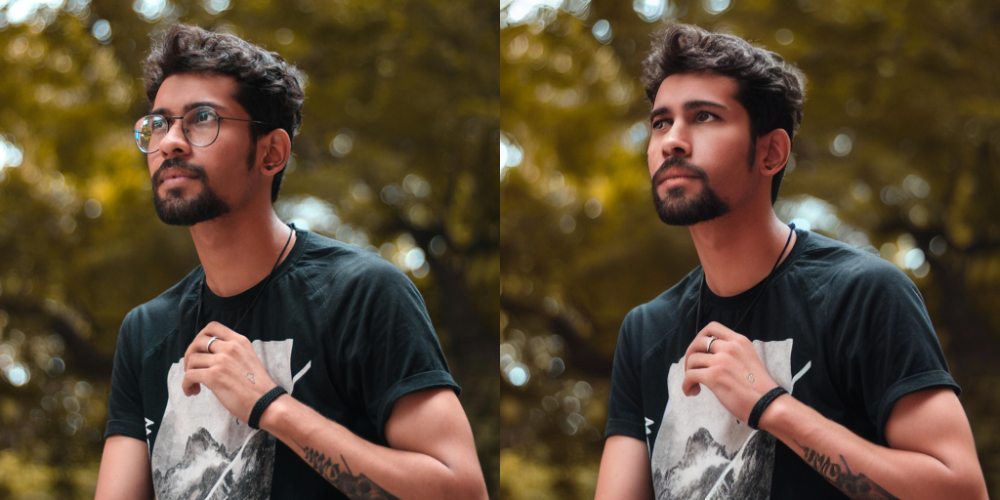

In [19]:
from diffusers import LEditsPPPipelineStableDiffusion

# Load the model as usual
pipe = LEditsPPPipelineStableDiffusion.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    variant="fp16"
)
pipe.to(device)

image = load_image(SampleURL.ManInGlasses)

# Invert the image, gradually adding noise to it so
# it can be denoised with modified directions,
# effectively providing an edit
pipe.invert(image=image, num_inversion_steps=50, skip=0.2)

# Edit the image with an editing prompt
edited_image = pipe(
    editing_prompt=["glasses"],
    # tell the model to remove the glasses by editing the direction
    reverse_editing_direction=[True],
    edit_guidance_scale=[1.5],
    edit_threshold=[0.95],
).images[0]

image_grid([image, edited_image], rows=1, cols=2)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

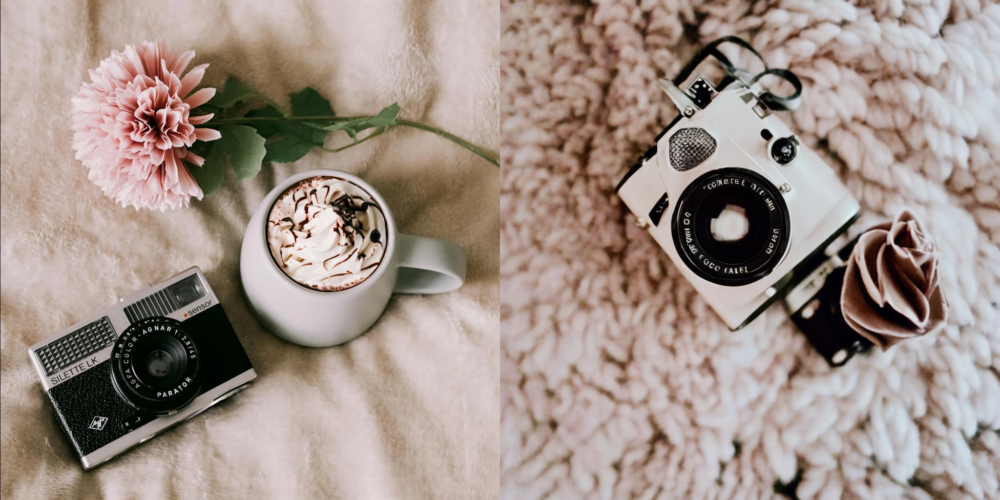

In [15]:
from diffusers import StableDiffusionXLPipeline

sdxl_base_pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
)
sdxl_base_pipeline.to(device)

# We load the IP Adapter too
sdxl_base_pipeline.load_ip_adapter(
    "h94/IP-Adapter", subfolder="sdxl_models", weight_name="ip-adapter_sdxl.bin"
)

# We can set the scale of how strong we
# want our IP Adapter to impact our overall result
sdxl_base_pipeline.set_ip_adapter_scale(0.8)

image = load_image(SampleURL.ItemsVariation)
original_image = image.resize((1024, 1024))

# Create the image variation
generator = torch.Generator(device=device).manual_seed(1)
variation_image = sdxl_base_pipeline(
    prompt="remove camera",
    ip_adapter_image=original_image,
    num_inference_steps=25,
    generator=generator,
).images

image_grid([original_image, variation_image[0]], rows=1, cols=2)